<a href="https://colab.research.google.com/github/Jeremy26/hydranets_course/blob/main/MTL_Run.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Welcome to the Extended HydraNet Workshop 🐸🐸🐸
In this workshop, you're going to learn how to add an object detection head to our pretrained network.
* Input: **a monocular RGB Image**
* Output: **a Depth Map**, **a Segmentation Map** and **Object Detections**

A single model with three different outputs. For that we'll need to use transfer learning to avoid retraining the entire model. There are many different ways to do this, the approach we're going to take here constructs the two headed model and loads the weights before making changes to the architecture and forward function.

# 1 — Initialize Environment

In [1]:
# TODO: Add training data to zip
#!wget https://hydranets-data.s3.eu-west-3.amazonaws.com/hydranets-data.zip && unzip -q hydranets-data.zip && mv hydranets-data/* . && rm hydranets-data.zip && rm -rf hydranets-data

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import cv2
import torch
import torch.nn as nn
import math
import torch.nn.functional as F
from torch.autograd import Variable

```
conda create --name hydranet pytorch torchvision torchaudio pytorch-cuda -c pytorch -c nvidia
conda activate hydranet
pip install opencv-python matplotlib ipykernel tqdm notebook prefetch_generator albumentations timm==0.6.13 efficientnet_pytorch
```

# 2 — Creating the HydraNet
Create the model in the same way as the previous workshop.


## 2.1 — Create a HydraNet class

In [3]:
class HydraNet(nn.Module):
    def __init__(self):        
        #super(HydraNet, self).__init__() # Python2
        super().__init__() # Python 3
        self.num_tasks = 2
        self.num_classes = 6

In [4]:
hydranet = HydraNet()

## 2.2 — Defining the Encoder: A MobileNetv2
![](https://iq.opengenus.org/content/images/2020/11/conv_mobilenet_v2.jpg)

In [5]:
def conv3x3(in_channels, out_channels, stride=1, dilation=1, groups=1, bias=False):
    """3x3 Convolution: Depthwise: 
    https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html
    """
    return nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=dilation, dilation=dilation, bias=bias, groups=groups)

In [6]:
def conv1x1(in_channels, out_channels, stride=1, groups=1, bias=False,):
    "1x1 Convolution: Pointwise"
    return nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=stride, padding=0, bias=bias, groups=groups)

In [7]:
def batchnorm(num_features):
    """
    https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm2d.html
    """
    return nn.BatchNorm2d(num_features, affine=True, eps=1e-5, momentum=0.1)

In [8]:
def convbnrelu(in_channels, out_channels, kernel_size, stride=1, groups=1, act=True):
    "conv-batchnorm-relu"
    if act:
        return nn.Sequential(nn.Conv2d(in_channels, out_channels, kernel_size, stride=stride, padding=int(kernel_size / 2.), groups=groups, bias=False),
                             batchnorm(out_channels),
                             nn.ReLU6(inplace=True))
    else:
        return nn.Sequential(nn.Conv2d(in_channels, out_channels, kernel_size, stride=stride, padding=int(kernel_size / 2.), groups=groups, bias=False),
                             batchnorm(out_channels))

In [9]:
class InvertedResidualBlock(nn.Module):
    """Inverted Residual Block from https://arxiv.org/abs/1801.04381"""
    def __init__(self, in_planes, out_planes, expansion_factor, stride=1):
        super().__init__() # Python 3
        intermed_planes = in_planes * expansion_factor
        self.residual = (in_planes == out_planes) and (stride == 1) # Boolean/Condition
        self.output = nn.Sequential(convbnrelu(in_planes, intermed_planes, 1),
                                    convbnrelu(intermed_planes, intermed_planes, 3, stride=stride, groups=intermed_planes),
                                    convbnrelu(intermed_planes, out_planes, 1, act=False))

    def forward(self, x):
        #residual = x
        out = self.output(x)
        if self.residual:
            return (out + x)#+residual
        else:
            return out

In [10]:
def define_mobilenet(self):
    mobilenet_config = [[1, 16, 1, 1], # expansion rate, output channels, number of repeats, stride
                    [6, 24, 2, 2],
                    [6, 32, 3, 2],
                    [6, 64, 4, 2],
                    [6, 96, 3, 1],
                    [6, 160, 3, 2],
                    [6, 320, 1, 1],
                    ]
    self.in_channels = 32 # number of input channels
    self.num_layers = len(mobilenet_config)
    self.layer1 = convbnrelu(3, self.in_channels, kernel_size=3, stride=2)
    c_layer = 2
    for t,c,n,s in (mobilenet_config):
        layers = []
        for idx in range(n):
            layers.append(InvertedResidualBlock(self.in_channels, c, expansion_factor=t, stride=s if idx == 0 else 1))
            self.in_channels = c
        setattr(self, 'layer{}'.format(c_layer), nn.Sequential(*layers)) # setattr(object, name, value)
        c_layer += 1

HydraNet.define_mobilenet = define_mobilenet

In [11]:
hydranet.define_mobilenet()

In [12]:
print(hydranet)

HydraNet(
  (layer1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU6(inplace=True)
  )
  (layer2): Sequential(
    (0): InvertedResidualBlock(
      (output): Sequential(
        (0): Sequential(
          (0): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Sequential(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (2): Sequential(
          (0): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affin

## 2.3 — Defining the Decoder - A Multi-Task Lighweight RefineNet
Paper: https://arxiv.org/pdf/1810.03272.pdf

![](https://d3i71xaburhd42.cloudfront.net/4d653b19ce1c7cba79fc2f11271fb90f7744c95c/4-Figure1-1.png)

In [13]:
class CRPBlock(nn.Module):
    """CRP definition"""
    def __init__(self, in_planes, out_planes, n_stages, groups=False):
        super().__init__() #Python 3
        for i in range(n_stages):
            setattr(self, '{}_{}'.format(i + 1, 'outvar_dimred'),
                    conv1x1(in_planes if (i == 0) else out_planes,
                            out_planes, stride=1,
                            bias=False, groups=in_planes if groups else 1)) #setattr(object, name, value)

        self.stride = 1
        self.n_stages = n_stages
        self.maxpool = nn.MaxPool2d(kernel_size=5, stride=1, padding=2)

    def forward(self, x):
        top = x
        for i in range(self.n_stages):
            top = self.maxpool(top)
            top = getattr(self, '{}_{}'.format(i + 1, 'outvar_dimred'))(top)#getattr(object, name[, default])
            x = top + x
        return x

In [14]:
def _make_crp(self, in_planes, out_planes, stages, groups=False):
    layers = [CRPBlock(in_planes, out_planes,stages, groups=groups)]
    return nn.Sequential(*layers)

HydraNet._make_crp = _make_crp

In [15]:
def define_lightweight_refinenet(self):
    ## Light-Weight RefineNet ##
    self.conv8 = conv1x1(320, 256, bias=False)
    self.conv7 = conv1x1(160, 256, bias=False)
    self.conv6 = conv1x1(96, 256, bias=False)
    self.conv5 = conv1x1(64, 256, bias=False)
    self.conv4 = conv1x1(32, 256, bias=False)
    self.conv3 = conv1x1(24, 256, bias=False)
    self.crp4 = self._make_crp(256, 256, 4, groups=False)
    self.crp3 = self._make_crp(256, 256, 4, groups=False)
    self.crp2 = self._make_crp(256, 256, 4, groups=False)
    self.crp1 = self._make_crp(256, 256, 4, groups=True)

    self.conv_adapt4 = conv1x1(256, 256, bias=False)
    self.conv_adapt3 = conv1x1(256, 256, bias=False)
    self.conv_adapt2 = conv1x1(256, 256, bias=False)

    self.pre_depth = conv1x1(256, 256, groups=256, bias=False)
    self.depth = conv3x3(256, 1, bias=True)
    self.pre_segm = conv1x1(256, 256, groups=256, bias=False)
    self.segm = conv3x3(256, self.num_classes, bias=True)
    self.relu = nn.ReLU6(inplace=True)

    if self.num_tasks == 3:
        self.pre_normal = conv1x1(256, 256, groups=256, bias=False)
        self.normal = conv3x3(256, 3, bias=True)

HydraNet.define_lightweight_refinenet = define_lightweight_refinenet

In [16]:
hydranet.define_lightweight_refinenet()

## 2.4 — Define the HydraNet Forward Function

> ![](https://d3i71xaburhd42.cloudfront.net/435d4b5c30f10753d277848a17baddebd98d3c31/2-Figure1-1.png)

In [17]:
def forward(self, x):
    # MOBILENET V2
    x = self.layer1(x)
    x = self.layer2(x) # x / 2
    l3 = self.layer3(x) # 24, x / 4
    l4 = self.layer4(l3) # 32, x / 8
    l5 = self.layer5(l4) # 64, x / 16
    l6 = self.layer6(l5) # 96, x / 16
    l7 = self.layer7(l6) # 160, x / 32
    l8 = self.layer8(l7) # 320, x / 32

    # LIGHT-WEIGHT REFINENET
    l8 = self.conv8(l8)
    l7 = self.conv7(l7)
    l7 = self.relu(l8 + l7)
    l7 = self.crp4(l7)
    l7 = self.conv_adapt4(l7)
    l7 = nn.Upsample(size=l6.size()[2:], mode='bilinear', align_corners=False)(l7)

    l6 = self.conv6(l6)
    l5 = self.conv5(l5)
    l5 = self.relu(l5 + l6 + l7)
    l5 = self.crp3(l5)
    l5 = self.conv_adapt3(l5)
    l5 = nn.Upsample(size=l4.size()[2:], mode='bilinear', align_corners=False)(l5)

    l4 = self.conv4(l4)
    l4 = self.relu(l5 + l4)
    l4 = self.crp2(l4)
    l4 = self.conv_adapt2(l4)
    l4 = nn.Upsample(size=l3.size()[2:], mode='bilinear', align_corners=False)(l4)

    l3 = self.conv3(l3)
    l3 = self.relu(l3 + l4)
    l3 = self.crp1(l3)

    # HEADS
    out_segm = self.pre_segm(l3)
    out_segm = self.relu(out_segm)
    out_segm = self.segm(out_segm)

    out_d = self.pre_depth(l3)
    out_d = self.relu(out_d)
    out_d = self.depth(out_d)

    if self.num_tasks == 3:
        out_n = self.pre_normal(l3)
        out_n = self.relu(out_n)
        out_n = self.normal(out_n)
        return out_segm, out_d, out_n
    else:
        return out_segm, out_d

HydraNet.forward = forward

# 3 — Run the Model
Let's make sure everything works.

## 3.1 — Load the Model Weights

In [18]:
if torch.cuda.is_available():
    _ = hydranet.cuda()
_ = hydranet.eval()

/home/brian/miniconda3/envs/hydranet/lib/python3.11/site-packages/torch/cuda/__init__.py:138: UserWarning: CUDA initialization: The NVIDIA driver on your system is too old (found version 11040). Please update your GPU driver by downloading and installing a new version from the URL: http://www.nvidia.com/Download/index.aspx Alternatively, go to: https://pytorch.org to install a PyTorch version that has been compiled with your version of the CUDA driver. (Triggered internally at /opt/conda/conda-bld/pytorch_1699449201450/work/c10/cuda/CUDAFunctions.cpp:108.)
  return torch._C._cuda_getDeviceCount() > 0


In [19]:
ckpt = torch.load('ExpKITTI_joint.ckpt')
hydranet.load_state_dict(ckpt['state_dict'])

<All keys matched successfully>

## 3.2 — Preprocess Images

In [20]:
IMG_SCALE  = 1./255
IMG_MEAN = np.array([0.485, 0.456, 0.406]).reshape((1, 1, 3))
IMG_STD = np.array([0.229, 0.224, 0.225]).reshape((1, 1, 3))

def prepare_img(img):
    return (img * IMG_SCALE - IMG_MEAN) / IMG_STD

## 3.3 — Load and Run an Image

In [21]:
# Pre-processing and post-processing constants #
CMAP = np.load('cmap_kitti.npy')
NUM_CLASSES = 6

In [22]:
print(CMAP)

[[128 128 128]
 [128   0   0]
 [128  64 128]
 [  0   0 192]
 [128 128   0]
 [ 64   0 128]
 [  0   0   0]]


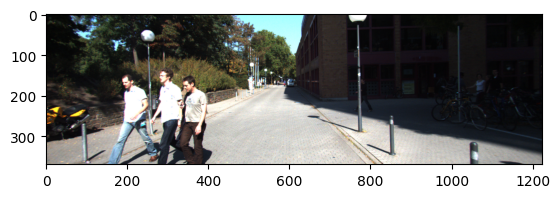

In [23]:
import glob
images_files = glob.glob('data/*.png')
idx = np.random.randint(0, len(images_files))

img_path = images_files[idx]
img = np.array(Image.open(img_path))
plt.imshow(img)
plt.show()

In [24]:
def pipeline(img):
    with torch.no_grad():
        img_var = Variable(torch.from_numpy(prepare_img(img).transpose(2, 0, 1)[None]), requires_grad=False).float()
        if torch.cuda.is_available():
            img_var = img_var.cuda()
        segm, depth = hydranet(img_var)
        segm = cv2.resize(segm[0, :NUM_CLASSES].cpu().data.numpy().transpose(1, 2, 0),
                        img.shape[:2][::-1],
                        interpolation=cv2.INTER_CUBIC)
        depth = cv2.resize(depth[0, 0].cpu().data.numpy(),
                        img.shape[:2][::-1],
                        interpolation=cv2.INTER_CUBIC)
        segm = CMAP[segm.argmax(axis=2)].astype(np.uint8)
        depth = np.abs(depth)
        return depth, segm

In [25]:
depth, segm = pipeline(img)

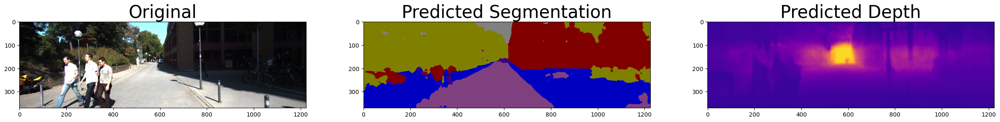

In [26]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,20))
ax1.imshow(img)
ax1.set_title('Original', fontsize=30)
ax2.imshow(segm)
ax2.set_title('Predicted Segmentation', fontsize=30)
ax3.imshow(depth, cmap="plasma", vmin=0, vmax=80)
ax3.set_title("Predicted Depth", fontsize=30)
plt.show()

## 3.4 — Run on a Video

In [27]:
print(img.shape)
print(depth.shape)
print(segm.shape)

(370, 1224, 3)
(370, 1224)
(370, 1224, 3)


(370, 1224, 3)


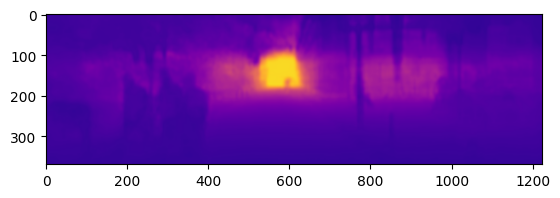

In [28]:
import matplotlib.cm as cm
import matplotlib.colors as co

def depth_to_rgb(depth):
    normalizer = co.Normalize(vmin=0, vmax=80)
    mapper = cm.ScalarMappable(norm=normalizer, cmap='plasma')
    colormapped_im = (mapper.to_rgba(depth)[:, :, :3] * 255).astype(np.uint8)
    return colormapped_im

depth_rgb = depth_to_rgb(depth)
print(depth_rgb.shape)
plt.imshow(depth_rgb)
plt.show()

(370, 1224, 3)
(370, 1224, 3)
(370, 1224, 3)


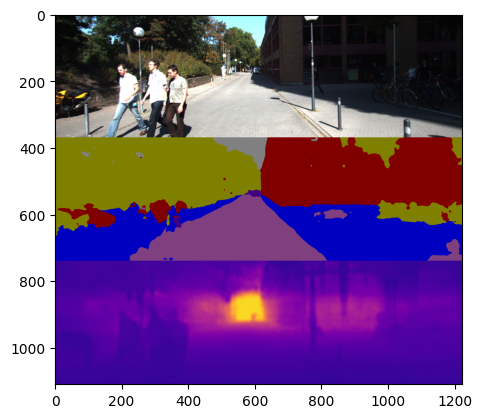

In [29]:
print(img.shape)
print(depth_rgb.shape)
print(segm.shape)
new_img = np.vstack((img, segm, depth_rgb))
plt.imshow(new_img)
plt.show()

In [30]:
video_files = sorted(glob.glob("data/*.png"))

# Build a HydraNet
hydranet = HydraNet()
hydranet.define_mobilenet()
hydranet.define_lightweight_refinenet()

# Set the Model to Eval on GPU
if torch.cuda.is_available():
    _ = hydranet.cuda()
_ = hydranet.eval()

# Load the Weights
ckpt = torch.load('ExpKITTI_joint.ckpt')
hydranet.load_state_dict(ckpt['state_dict'])

# Run the pipeline
result_video = []
for idx, img_path in enumerate(video_files):
    image = np.array(Image.open(img_path))
    h, w, _ = image.shape 
    depth, seg = pipeline(image)
    result_video.append(cv2.cvtColor(cv2.vconcat([image, seg, depth_to_rgb(depth)]), cv2.COLOR_BGR2RGB))

out = cv2.VideoWriter('output/out.mp4',cv2.VideoWriter_fourcc(*'mp4v'), 15, (w,3*h))

for i in range(len(result_video)):
    out.write(result_video[i])
out.release()

In [31]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('output/out.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=800 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

# 4 — Add an Object Detection Head

## 4.1 — Extend the Model
At this point we have a model with pretrained weights. Let's freeze those then extend it by adding some layers and modifying the forward function.

In [32]:
for param in hydranet.parameters():
    param.requires_grad = False

In [33]:
conv1 = nn.Conv2d(256,128,1,1)
conv2 = nn.Conv2d(128,64,3,1)
conv3 = nn.Conv2d(64,1,3,1)
hydranet.new_head = nn.DataParallel(nn.Sequential(conv1, nn.ReLU6(inplace=True), conv2, nn.ReLU6(inplace=True), conv3, nn.ReLU6(inplace=True)))

def extended_forward(self, x):
    # MOBILENET V2
    x = self.layer1(x)
    x = self.layer2(x) # x / 2
    l3 = self.layer3(x) # 24, x / 4
    l4 = self.layer4(l3) # 32, x / 8
    l5 = self.layer5(l4) # 64, x / 16
    l6 = self.layer6(l5) # 96, x / 16
    l7 = self.layer7(l6) # 160, x / 32
    l8 = self.layer8(l7) # 320, x / 32

    # LIGHT-WEIGHT REFINENET
    l8 = self.conv8(l8)
    l7 = self.conv7(l7)
    l7 = self.relu(l8 + l7)
    l7 = self.crp4(l7)
    l7 = self.conv_adapt4(l7)
    l7 = nn.Upsample(size=l6.size()[2:], mode='bilinear', align_corners=False)(l7)

    l6 = self.conv6(l6)
    l5 = self.conv5(l5)
    l5 = self.relu(l5 + l6 + l7)
    l5 = self.crp3(l5)
    l5 = self.conv_adapt3(l5)
    l5 = nn.Upsample(size=l4.size()[2:], mode='bilinear', align_corners=False)(l5)

    l4 = self.conv4(l4)
    l4 = self.relu(l5 + l4)
    l4 = self.crp2(l4)
    l4 = self.conv_adapt2(l4)
    l4 = nn.Upsample(size=l3.size()[2:], mode='bilinear', align_corners=False)(l4)

    l3 = self.conv3(l3)
    l3 = self.relu(l3 + l4)
    l3 = self.crp1(l3)

    # HEADS
    out_segm = self.pre_segm(l3)
    out_segm = self.relu(out_segm)
    out_segm = self.segm(out_segm)

    out_d = self.pre_depth(l3)
    out_d = self.relu(out_d)
    out_d = self.depth(out_d)

    out_new = self.new_head(l3) # this is the new one

    return out_segm, out_d, out_new

HydraNet.forward = extended_forward

Since we have a new head we need to modify the imaging pipeline.

In [34]:
def pipeline(img):
    with torch.no_grad():
        img_var = Variable(torch.from_numpy(prepare_img(img).transpose(2, 0, 1)[None]), requires_grad=False).float()
        if torch.cuda.is_available():
            img_var = img_var.cuda()
        segm, depth, od = hydranet(img_var)
        segm = cv2.resize(segm[0, :NUM_CLASSES].cpu().data.numpy().transpose(1, 2, 0),
                        img.shape[:2][::-1],
                        interpolation=cv2.INTER_CUBIC)
        depth = cv2.resize(depth[0, 0].cpu().data.numpy(),
                        img.shape[:2][::-1],
                        interpolation=cv2.INTER_CUBIC)
        od = cv2.resize(od[0, 0].cpu().data.numpy(),
                        img.shape[:2][::-1],
                        interpolation=cv2.INTER_CUBIC)
        segm = CMAP[segm.argmax(axis=2)].astype(np.uint8)
        depth = np.abs(depth)
        return depth, segm, od

Let's see what our new head looks like before training.

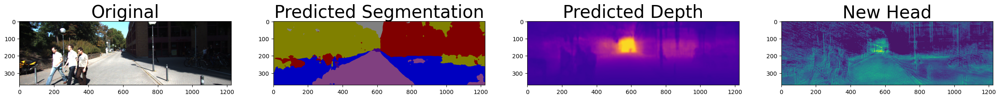

In [35]:
depth, segm, od = pipeline(img)

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30,20))
ax1.imshow(img)
ax1.set_title('Original', fontsize=30)
ax2.imshow(segm)
ax2.set_title('Predicted Segmentation', fontsize=30)
ax3.imshow(depth, cmap="plasma", vmin=0, vmax=80)
ax3.set_title("Predicted Depth", fontsize=30)
ax4.imshow(od)
ax4.set_title('New Head', fontsize=30)
plt.show()

## 4.2 — Train the New Head

In [45]:
from model_helpers import Saver, load_state_dict
import operator
from utils import Normalise, RandomCrop, ToTensor, RandomMirror, InvHuberLoss, AverageMeter, MeanIoU, RMSE
from tqdm import tqdm

init_vals = (0.0, 10000.0)
comp_fns = [operator.gt, operator.lt]
ckpt_dir = "./extended_model"
ckpt_path = "./extended/checkpoint.pth.tar"

saver = Saver(
    #args=locals(),           # Causes issues in VSCode
    args={"items": None},
    ckpt_dir=ckpt_dir,
    best_val=init_vals,
    condition=comp_fns,
    save_several_mode=all,
)

n_epochs = 200

print("Model has {} parameters".format(sum([p.numel() for p in hydranet.parameters()])))

start_epoch, _, state_dict = saver.maybe_load(ckpt_path=ckpt_path, keys_to_load=["epoch", "best_val", "state_dict"],)
load_state_dict(hydranet, state_dict)

if start_epoch is None:
    start_epoch = 0

def train(model, opts, crits, dataloader, loss_coeffs=(1.0,), grad_norm=0.0):
    model.train()

    device = torch.device("cuda") if torch.cuda.is_available() else "cpu"
    loss_meter = AverageMeter()
    pbar = tqdm(dataloader)

    for sample in pbar:
        loss = 0.0
        input = sample["image"].float().to(device)
        targets = [sample[k].to(device) for k in dataloader.dataset.masks_names]
        outputs = model(input)

        loss = crits[0](
                F.interpolate(
                    outputs[-1], size=targets[-1].size()[1:], mode="bilinear", align_corners=False
                ).squeeze(dim=1),
                targets[-1].squeeze(dim=1),
            )
        
        opts[0].zero_grad()
        loss.backward()
        if grad_norm > 0.0:
            torch.nn.utils.clip_grad_norm_(model.parameters(), grad_norm)
        opts[0].step()

        loss_meter.update(loss.item())
        pbar.set_description(
            "Loss {:.3f} | Avg. Loss {:.3f}".format(loss.item(), loss_meter.avg)
        )

def validate(model, metrics, dataloader):
    device = torch.device("cuda") if torch.cuda.is_available() else "cpu"
    model.eval()
    for metric in metrics:
        metric.reset()

    pbar = tqdm(dataloader)

    def get_val(metrics):
        results = [(m.name, m.val()) for m in metrics]
        names, vals = list(zip(*results))
        out = ["{} : {:4f}".format(name, val) for name, val in results]
        return vals, " | ".join(out)

    with torch.no_grad():
        for sample in pbar:
            # Get the Data
            input = sample["image"].float().to(device)
            targets = [sample[k].to(device) for k in dataloader.dataset.masks_names]

            targets = [target.squeeze(dim=1).cpu().numpy() for target in targets]

            # Forward
            #seg, depth, depth2 = model(input)
            #outputs = [seg, depth2]         # Use the new depth head for metric calculation
            outputs = model(input)
            outputs.pop(-1)                 # Remove the backbone from the outputs
            #outputs[1] = depth2             # Use the new depth head for metric calculation


            # Backward
            for out, target, metric in zip(outputs, targets, metrics):
                metric.update(
                    F.interpolate(out, size=target.shape[1:], mode="bilinear", align_corners=False)
                    .squeeze(dim=1)
                    .cpu()
                    .numpy(),
                    target,
                )
            pbar.set_description(get_val(metrics)[1])
    vals, _ = get_val(metrics)
    print("----" * 5)
    return vals

Model has 3098952 parameters


In [46]:
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
import os

train_file = "train_list_depth.txt"
val_file = "val_list_depth.txt"

train_batch_size = 16
val_batch_size = 16
crop_size = 400

img_scale = 1.0 / 255
depth_scale = 5000.0

img_mean = np.array([0.485, 0.456, 0.406])
img_std = np.array([0.229, 0.224, 0.225])

normalise_params = [img_scale, img_mean.reshape((1, 1, 3)), img_std.reshape((1, 1, 3)), depth_scale,]
transform_common = [Normalise(*normalise_params), ToTensor()]
transform_train = transforms.Compose([RandomMirror(), RandomCrop(crop_size)] + transform_common)
transform_val = transforms.Compose(transform_common)

class HydranetDataset(Dataset):

    def __init__(self, data_file, transform=None):
        with open(data_file, "rb") as f:
            datalist = f.readlines()
        self.datalist = [x.decode("utf-8").strip("\n").split("\t") for x in datalist]
        self.root_dir = "nyud"
        self.transform = transform
        self.masks_names = ("segm", "depth")

    def __len__(self):
        return len(self.datalist)

    def __getitem__(self, idx):
        abs_paths = [os.path.join(self.root_dir, rpath) for rpath in self.datalist[idx]] # Will output list of nyud/*/00000.png
        sample = {}
        sample["image"] = np.array(Image.open(abs_paths[0])) #dtype = np.float32

        for mask_name, mask_path in zip(self.masks_names, abs_paths[1:]):
            mask = np.array(Image.open(mask_path))
            assert len(mask.shape) == 2, "Masks must be encoded without colourmap"
            sample[mask_name] = mask

        if self.transform:
            sample["names"] = self.masks_names
            sample = self.transform(sample)
            # the names key can be removed by the transformation
            if "names" in sample:
                del sample["names"]
        return sample
    

#TRAIN DATALOADER
trainloader = DataLoader(
    HydranetDataset(train_file, transform=transform_train,),
    batch_size=train_batch_size,
    shuffle=True,
    num_workers=4,
    pin_memory=True,
    drop_last=True,
)

# VALIDATION DATALOADER
valloader = DataLoader(
    HydranetDataset(val_file, transform=transform_val,),
    batch_size=val_batch_size, 
    shuffle=False, 
    num_workers=4, 
    pin_memory=True,
    drop_last=False,)

In [47]:
print(start_epoch)
val_every = 5
lr_decoder = 1e-3
num_classes = (40, 1)

ignore_index = 255
ignore_depth = 0

# Try a different optimizer and loss function
optims = [torch.optim.Adam(hydranet.new_head.parameters(), lr=lr_decoder)]
crit_depth = nn.MSELoss()

opt_scheds = []
for opt in optims:
    opt_scheds.append(torch.optim.lr_scheduler.MultiStepLR(opt, np.arange(start_epoch + 1, n_epochs, 100), gamma=0.1))
          
for i in range(start_epoch, n_epochs + 1):
    
    print("Epoch {:d}".format(i))
    #train(hydranet, optims, [crit_depth], trainloader, loss_coeffs)
    train(hydranet, optims, [crit_depth], trainloader)

    for sched in opt_scheds:
        sched.step()
    
    if i % val_every == 0:
        metrics = [MeanIoU(num_classes[0]),RMSE(ignore_val=ignore_depth),]

        with torch.no_grad():
            vals = validate(hydranet, metrics, valloader)
        saver.maybe_save(new_val=vals, dict_to_save={"state_dict": hydranet.state_dict(), "epoch": i})

0
Epoch 0


Loss 2.826 | Avg. Loss 2.555: 100%|██████████| 49/49 [02:22<00:00,  2.90s/it]
  0%|          | 0/41 [00:05<?, ?it/s]


AttributeError: 'tuple' object has no attribute 'pop'